In [ ]:
#%cd /content/gdrive/MyDrive/42028/AT2
# !unzip data.zip
# %cd data

/content/gdrive/MyDrive/42028/AT2


In [1]:
!git clone https://github.com/GitarthVaishnav/FasterRCNN42028.git

Cloning into 'FasterRCNN42028'...
remote: Enumerating objects: 124, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (84/84), done.
remote: Total 124 (delta 51), reused 108 (delta 37), pack-reused 0
Receiving objects: 100% (124/124), 4.28 MiB | 24.34 MiB/s, done.
Resolving deltas: 100% (51/51), done.


In [2]:
# Enter the repo directory.
%cd FasterRCNN42028/

/content/FasterRCNN42028


In [3]:
# Install the Requirements
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.3/776.3 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 73.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 74.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 91.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 952.4/952.4 kB 65.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 51.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 88.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.3/203.3 kB 25.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [5]:
!cd /content/FasterRCNN42028
!unzip /content/gdrive/MyDrive/42028/AT2/data.zip

Streaming output truncated to the last 5000 lines.
  inflating: Object_Detection/yolo/train/labels/101525.txt  
  inflating: Object_Detection/yolo/train/labels/101377.txt  
  inflating: Object_Detection/yolo/train/labels/100582.txt  
  inflating: Object_Detection/yolo/train/labels/101994.txt  
  inflating: Object_Detection/yolo/train/labels/101989.txt  
  inflating: Object_Detection/yolo/train/labels/100704.txt  
  inflating: Object_Detection/yolo/train/labels/101240.txt  
  inflating: Object_Detection/yolo/train/labels/100766.txt  
  inflating: Object_Detection/yolo/train/labels/101905.txt  
  inflating: Object_Detection/yolo/train/labels/100369.txt  
  inflating: Object_Detection/yolo/train/labels/100694.txt  
  inflating: Object_Detection/yolo/train/labels/101702.txt  
  inflating: Object_Detection/yolo/train/labels/102041.txt  
  inflating: Object_Detection/yolo/train/labels/100214.txt  
  inflating: Object_Detection/yolo/train/labels/102025.txt  
  inflating: Object_Detection/yolo

In [ ]:
# %cd /content/FasterRCNN42028

/content/FasterRCNN42028


In [6]:
%pwd

'/content/FasterRCNN42028'

In [9]:
%%writefile data_configs/custom_data.yaml
# Images and labels direcotry should be relative to train.py
TRAIN_DIR_IMAGES: 'Object_Detection/pascal/train'
TRAIN_DIR_LABELS: 'Object_Detection/pascal/train'
VALID_DIR_IMAGES: 'Object_Detection/pascal/valid'
VALID_DIR_LABELS: 'Object_Detection/pascal/valid'
TEST_DIR_IMAGES: 'Object_Detection/pascal/test'
TEST_DIR_LABELS: 'Object_Detection/pascal/test'

# Class names.
CLASSES: [
    '__background__',
    'boat',
    'car',
    'jetski',
    'lift',
    'dock'
]

# Number of classes (object classes + 1 for background class in Faster RCNN).
NC: 6

# Whether to save the predictions of the validation set while training.
SAVE_VALID_PREDICTION_IMAGES: True

Overwriting data_configs/custom_data.yaml


In [7]:
!wandb disabled

W&B disabled.


In [10]:
!python train.py --config data_configs/custom_data.yaml --epochs 50 --model fasterrcnn_resnet50_fpn_v2 --project-name frcnnTraining --batch-size 8 --no-mosaic

Not using distributed mode
device cuda
2023-05-14 15:40:06.391084: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-14 15:40:07.473333: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Creating data loaders
Number of training samples: 1435
Number of validation samples: 307

Building model from scratch...
Layer (type:depth-idx)                             Output Shape              Param #
FasterRCNN                                         [100, 4]                  --
├─GeneralizedRCNNTransform: 1-1                    [8, 3, 800, 800]          --
├─BackboneWithFPN: 1-2                             [8, 256, 13, 13]          --
│    └─IntermediateLayerGetter: 2-1                [8, 2048, 25, 25]         --

In [12]:
import matplotlib.pyplot as plt
import glob as glob

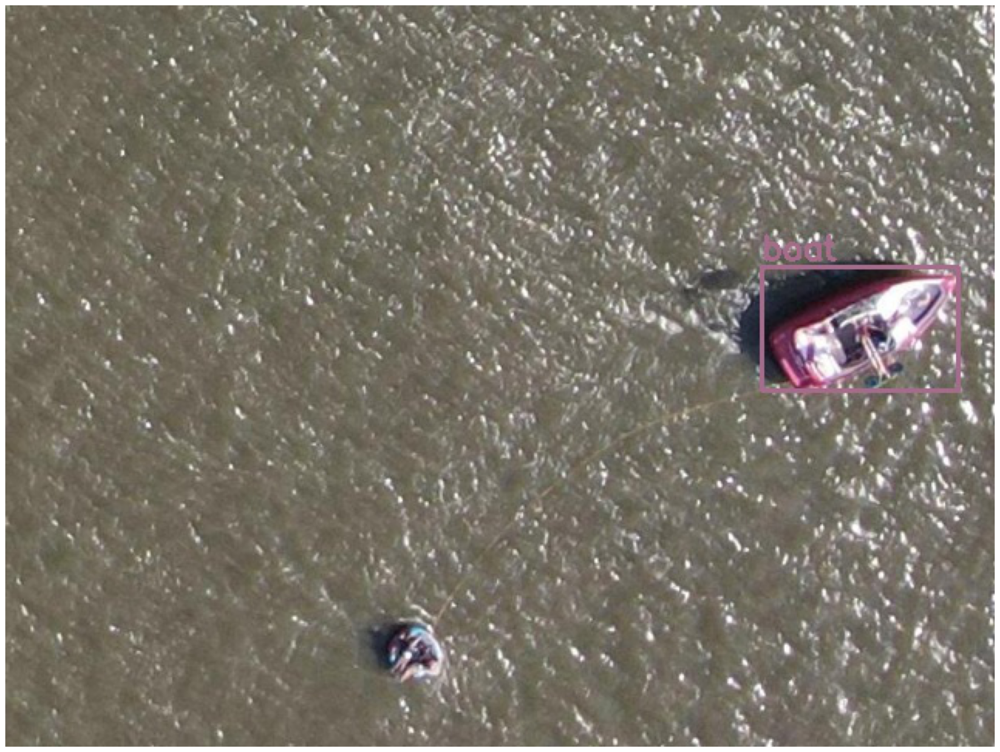

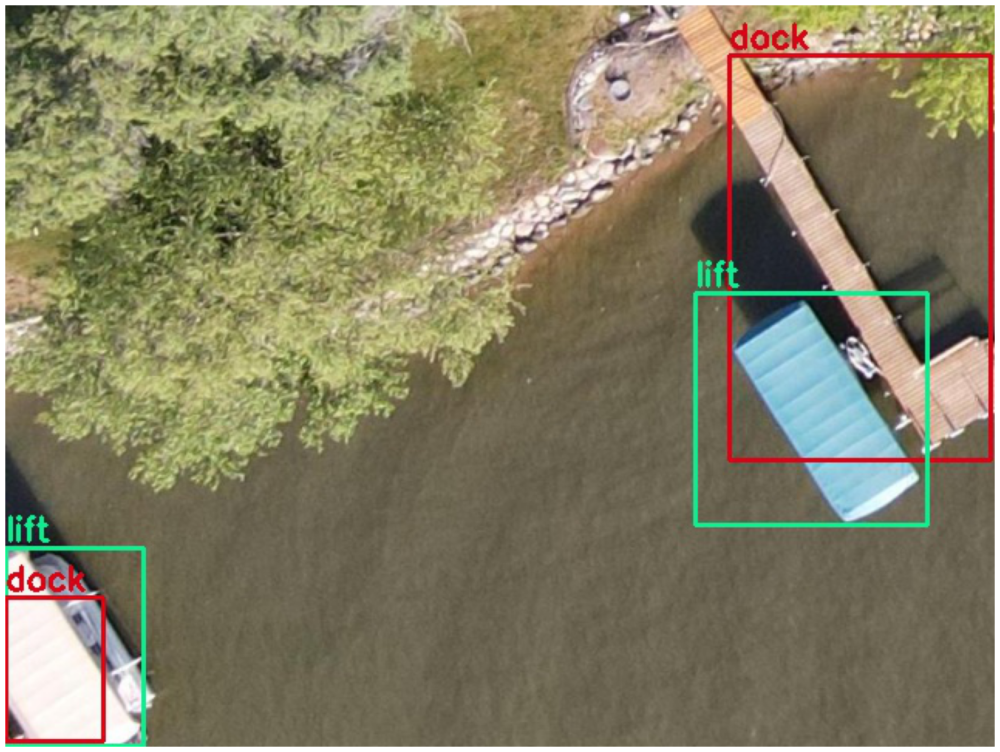

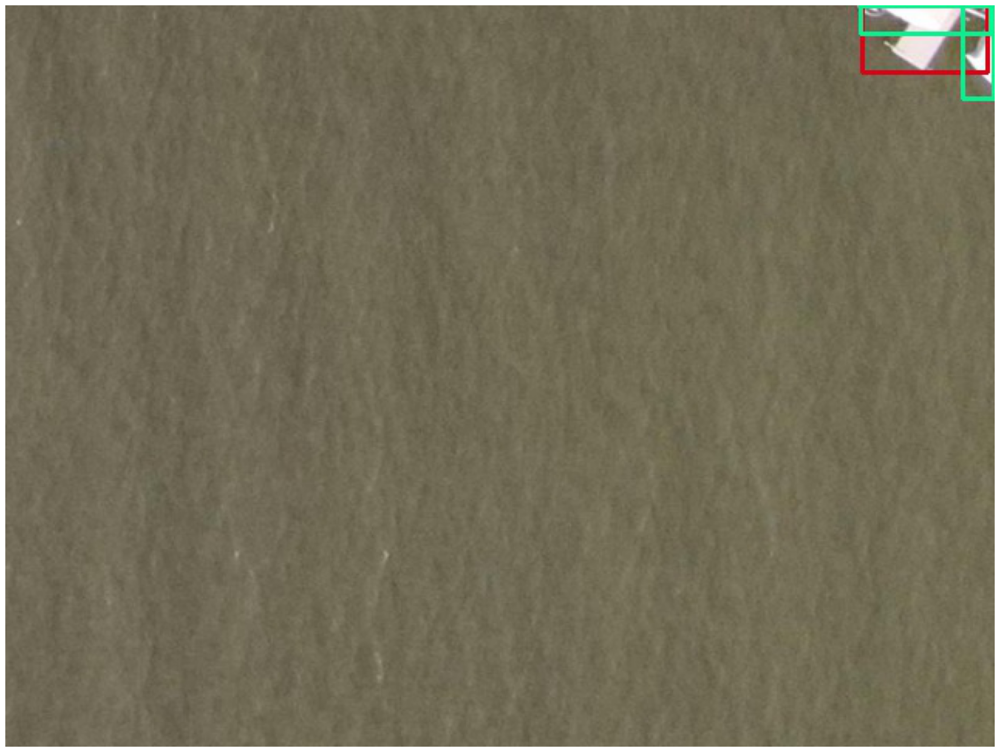

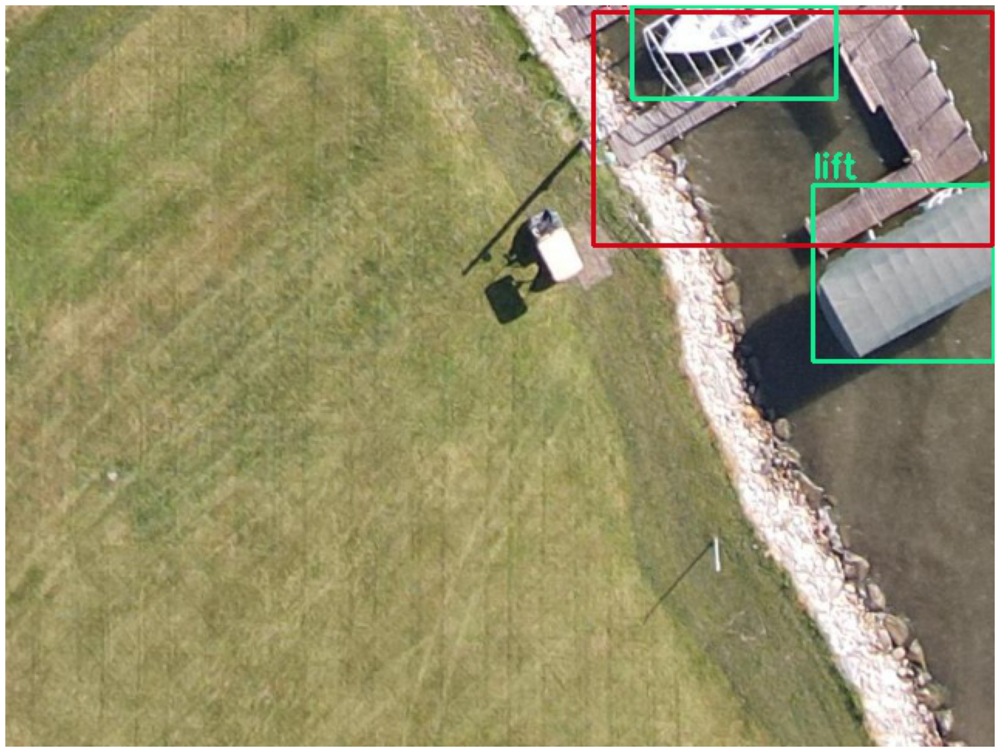

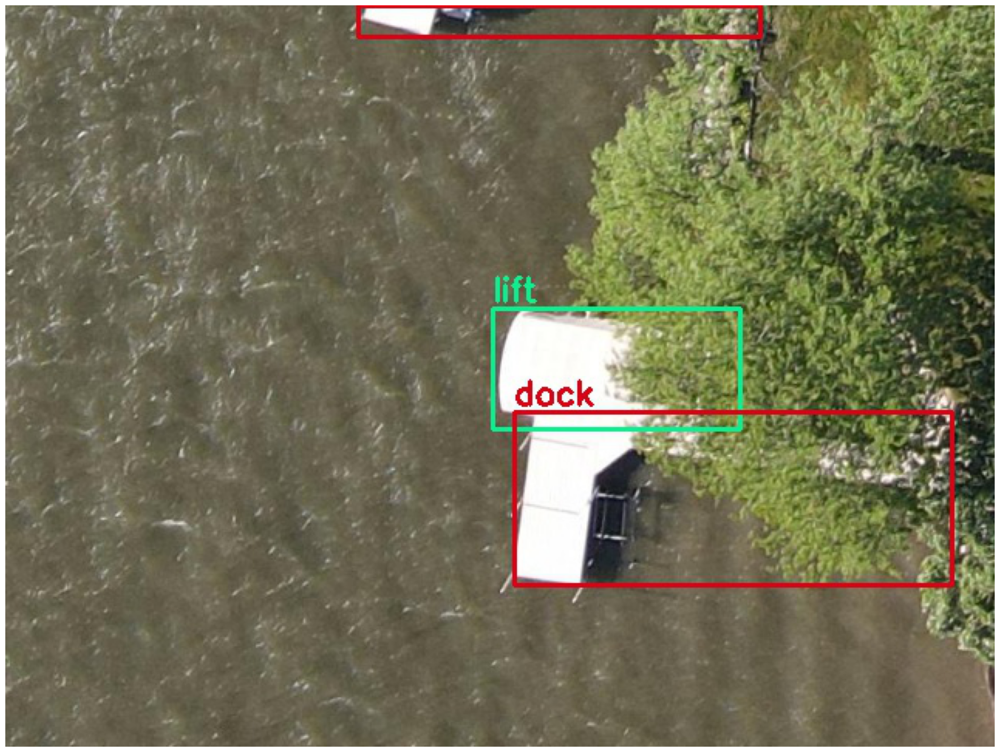

In [14]:
results_dir_path = '/content/FasterRCNN42028/outputs/training/frcnnTraining'
valid_images = glob.glob(f"{results_dir_path}/*.jpg")

for i in range(5):
    plt.figure(figsize=(24, 24))
    image = plt.imread(valid_images[i])
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [16]:
# No verbose mAP.
!python eval.py --weights outputs/training/frcnnTraining/best_model.pth --config data_configs/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2

100% 39/39 [00:17<00:00,  2.18it/s]


{'map': tensor(0.6469),
 'map_50': tensor(0.9220),
 'map_75': tensor(0.6912),
 'map_large': tensor(0.7563),
 'map_medium': tensor(0.5563),
 'map_per_class': tensor(-1.),
 'map_small': tensor(0.3280),
 'mar_1': tensor(0.4957),
 'mar_10': tensor(0.7097),
 'mar_100': tensor(0.7097),
 'mar_100_per_class': tensor(-1.),
 'mar_large': tensor(0.7998),
 'mar_medium': tensor(0.6591),
 'mar_small': tensor(0.3569)}


In [18]:
# Verbose mAP.
!python eval.py --weights outputs/training/frcnnTraining/best_model.pth --config data_configs/custom_data.yaml --model fasterrcnn_resnet50_fpn_v2 --verbose

100% 39/39 [00:17<00:00,  2.17it/s]


{'map': tensor(0.6469),
 'map_50': tensor(0.9220),
 'map_75': tensor(0.6912),
 'map_large': tensor(0.7563),
 'map_medium': tensor(0.5563),
 'map_per_class': tensor([0.6343, 0.7006, 0.5874, 0.6987, 0.6136]),
 'map_small': tensor(0.3280),
 'mar_1': tensor(0.4957),
 'mar_10': tensor(0.7097),
 'mar_100': tensor(0.7097),
 'mar_100_per_class': tensor([0.6838, 0.7355, 0.6869, 0.7656, 0.6768]),
 'mar_large': tensor(0.7998),
 'mar_medium': tensor(0.6591),
 'mar_small': tensor(0.3569)}


"Classes: ['__background__', 'boat', 'car', 'jetski', 'lift', 'dock']"


AP / AR per class
-------------------------------------------------------------------------
|    | Class                | AP                  | AR                  |
-------------------------------------------------------------------------
|1   | boat                 | 0.634               | 0.684               |
|2   | car                  | 0.701               | 0.735               |
|3   | jetski     

In [22]:
!python inference.py --input Object_Detection/pascal/test --weights outputs/training/frcnnTraining/best_model.pth

Building from model name arguments...
Test instances: 307
Image 1 done...
--------------------------------------------------
Image 2 done...
--------------------------------------------------
Image 3 done...
--------------------------------------------------
Image 4 done...
--------------------------------------------------
Image 5 done...
--------------------------------------------------
Image 6 done...
--------------------------------------------------
Image 7 done...
--------------------------------------------------
Image 8 done...
--------------------------------------------------
Image 9 done...
--------------------------------------------------
Image 10 done...
--------------------------------------------------
Image 11 done...
--------------------------------------------------
Image 12 done...
--------------------------------------------------
Image 13 done...
--------------------------------------------------
Image 14 done...
--------------------------------------------------

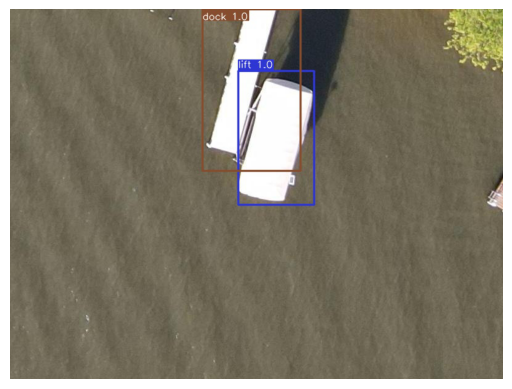

In [23]:
image = plt.imread('outputs/inference/res_2/100005.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

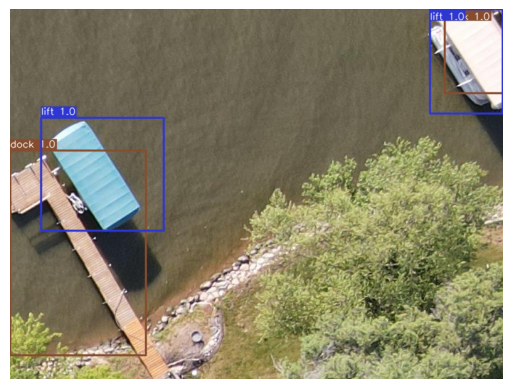

In [24]:
image = plt.imread('outputs/inference/res_2/100011.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

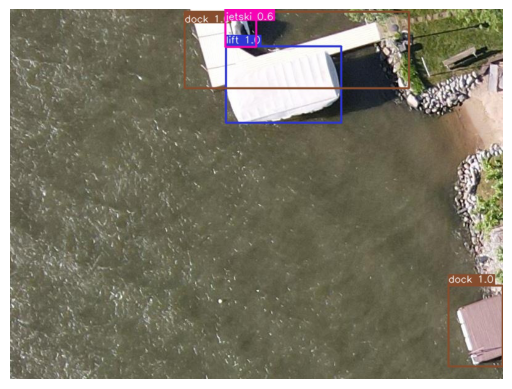

In [25]:
image = plt.imread('outputs/inference/res_2/100028.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

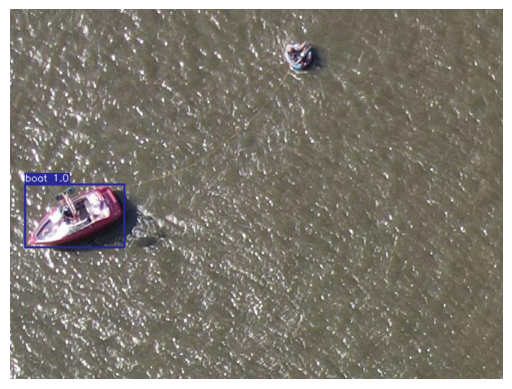

In [26]:
image = plt.imread('outputs/inference/res_2/100029.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

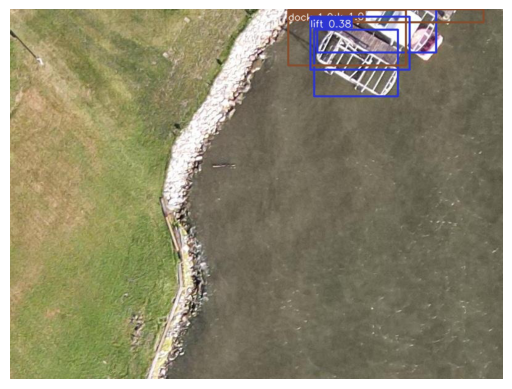

In [27]:
image = plt.imread('outputs/inference/res_2/100060.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

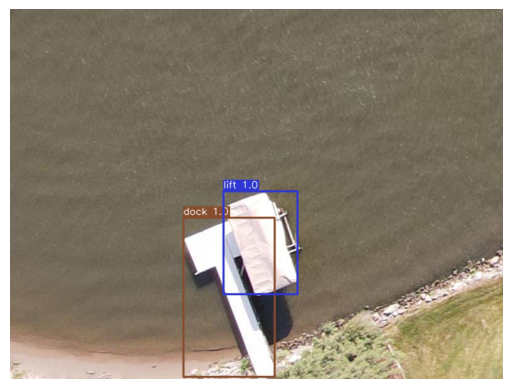

In [28]:
image = plt.imread('outputs/inference/res_2/100082.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()